## End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1.Problem
Identifying the breed of a dog given an image of a dog.

## 2.Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3.Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4.Features
Some information about the data:

 * We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
 * There are 120 breeds of dogs (this means there are 120 different classes).
 * There are around 10,000+ images in the training set (these images have labels).
 * There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [1]:
# # Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.9.1


In [2]:
# Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

TF version: 2.9.1
TF Hub version: 0.12.0


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [3]:
import pandas as pd
labels_csv = pd.read_csv(r"C:\Users\tamal\OneDrive\Desktop\Deep Learning\dog-breed-identification\labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<AxesSubplot:>

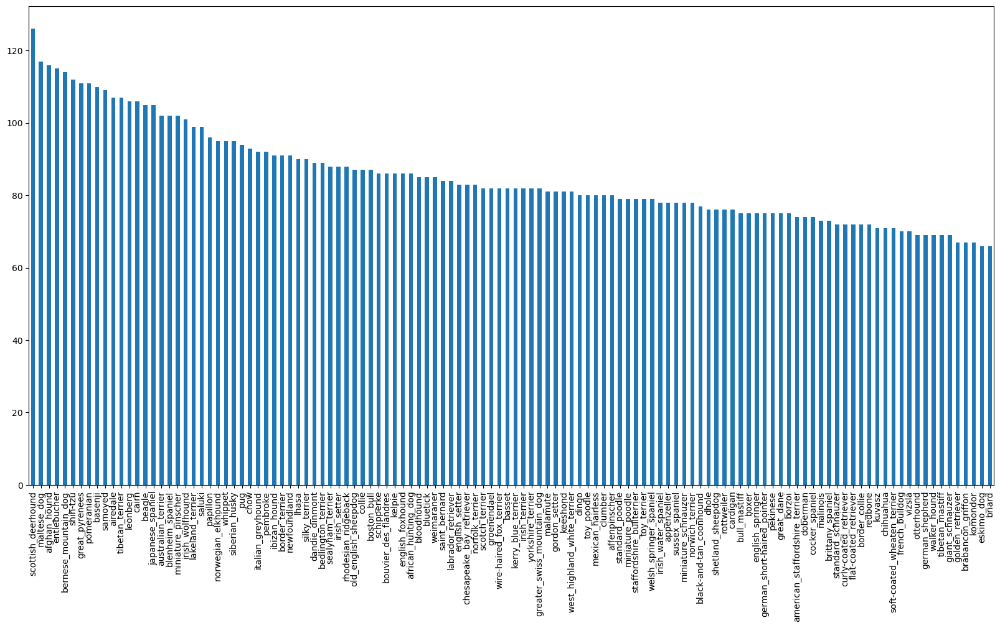

In [4]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10))

In [5]:
labels_csv['breed'].value_counts().median()

82.0

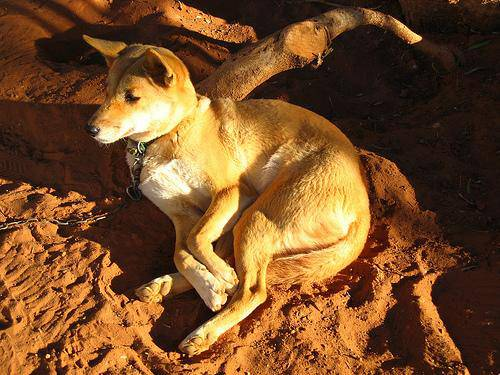

In [6]:
from IPython.display import Image
# from PIL import Image
Image("C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all image file pathnames

In [7]:
# Create pathnames from image ID's

filenames = ["C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\"+fname+".jpg" for fname in labels_csv['id']]

filenames[:10]

['C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\000bec180eb18c7604dcecc8fe0dba07.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\001cdf01b096e06d78e9e5112d419397.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\002211c81b498ef88e1b40b9abf84e1d.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\002a283a315af96eaea0e28e7163b21

In [8]:
# check whether number og filenames matches number of actual image files

import os
if len(os.listdir("C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\")) == len(filenames):
    print("File names match with actual amount of files!!!")
else:
    print("Data is not matching, plz check!!")

File names match with actual amount of files!!!


In [9]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
len(labels)

10222

In [11]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [12]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [13]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
# Turn a single label into an array of booleans

print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:10]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

In [17]:
# Turning boolean array into integers

print(labels[0])  #original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occure in boolean array
print(boolean_labels[0].astype(int))  #there will be a 1 where sample label occure

boston_bull
(array([19], dtype=int64),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating validation set

In [18]:
# Setup X & y
X = filenames
y = boolean_labels

In [19]:
# We are foing to start off experimenting with ~1000 images and increases as needed

NUM_IMAGES = 1000 

In [20]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split
# Split the data into training and validation of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size = 0.2,
                                                 random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [21]:
X_train[:2], y_train[:2]

(['C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\00bee065dcec471f26394855c5c2f3de.jpg',
  'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\train\\0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, Fa

## Preprocessing images(turning images into Tensors)

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors
4. Normalize our **image** (convert color channel values from from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified **image**

In [22]:
# Convert image to Numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [23]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [24]:
image.max(), image.min()

(255, 0)

In [25]:
# Turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [26]:
# Define image size

IMG_SIZE = 224

def process_image(image_path, img_size = IMG_SIZE):
    """
    Takes an image file path and turns the image into Tensors
    """
    #Read in an image file
    image = tf.io.read_file(image_path)
    #Turn the jpeg image into numerical Tensors with 3 colour channels(Red, Green, Blue)
    image = tf.image.decode_jpeg(image, channels = 3)
    #Resize the image to our desired value(224, 224)
    image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])
    
    return image

In [27]:
# tensor = tf.io.read_file(filenames[26])
# tensor

In [28]:
# tensor = tf.image.decode_jpeg(tensor, channels = 3)

In [29]:
# tf.image.convert_image_dtype(tensor, tf.float32)

## Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [30]:
# Create a function to return a tuple(image, label)

def get_image_label(image_path, label):
    """
    Takes an image file path name and the associated label,
    process the image and returns a tuple of(image, label).
    """
    image = process_image(image_path)
    return image, label

In [31]:
#Demo of above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 83.236534  , 133.1836    ,  82.436806  ],
         [ 64.697754  , 113.13456   ,  61.50028   ],
         [ 65.534386  , 113.91071   ,  60.929058  ],
         ...,
         [ 74.779015  , 132.34285   ,  81.996445  ],
         [ 75.79053   , 133.79053   ,  84.22733   ],
         [ 75.186874  , 133.18687   ,  85.186874  ]],
 
        [[ 66.05301   , 115.71407   ,  69.60177   ],
         [ 62.157993  , 112.378975  ,  65.146835  ],
         [ 72.39411   , 120.39411   ,  72.16197   ],
         ...,
         [ 71.0263    , 128.21379   ,  79.06201   ],
         [ 72.4933    , 130.27232   ,  82.935265  ],
         [ 73.49589   , 131.2749    ,  83.93785   ]],
 
        [[ 53.40004   , 103.76702   ,  65.770996  ],
         [ 61.31571   , 111.9474    ,  73.15723   ],
         [ 73.95284   , 122.240585  ,  82.23173   ],
         ...,
         [ 66.48884   , 123.45766   ,  76.8192    ],
         [ 69.10889   , 126.10889   ,  81.8455  

let's make a function to turn all of our data (X & y) into batches!

In [32]:
BATCH_SIZE = 32   #batch sixe 32 is a good start

#Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches of data out of image (X) and label (y) pairs.
    Shuffles the data if it's training data but doesn't shuffle if it's validation data.
    Also accepts test data as input (no labels).
    """
    # If the Data is test dataset -- There is no labels
    if test_data:
        print('Creating test data batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))   #only filepath(No label)
        data_batch = data.map(process_image).batch(BATCH_SIZE)
        return data_batch
    
    #If the data is a valid Dataset, no need to shuffle it
    elif valid_data:
        print('Creating validation data batches...')
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  #filepaths
                                                  tf.constant(y)))  #labels
        data_batch = data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch
    
    else:
        print('Creating training data batches...')
        # Turn filepaths and labels into Tensors
        data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                  tf.constant(y)))
        # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
        data = data.shuffle(buffer_size=len(X))
        
        # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
        data = data.map(get_image_label)
        
        # Turn the training data into batches
        data_batch = data.batch(BATCH_SIZE)
    return data_batch
        

In [33]:
# Create training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data = True)

Creating training data batches...
Creating validation data batches...


In [34]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [35]:
import matplotlib.pyplot as plt

# Create a function for viewing image in a data batch
def show_25_images(images, labels):
    """
    Displays a plot of 25 images and their labels from a data batch
    """
    # Setup the figure
    plt.figure(figsize=(20,20))
    # Loop through 25(for displaying 25 images)
    for i in range(25):
        # Create subplots (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i+1)
        # Display an image 
        plt.imshow(images[i].astype("uint8"))
        # plt.imshow(images[i])
        # Add the image label as the title
        plt.title(unique_breeds[labels[i].argmax()])
        # Turn the grid lines off
        plt.axis("off") 
    
    
    

In [36]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [37]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[ 40.973392 ,  55.973392 ,  52.973392 ],
          [ 44.808037 ,  59.808037 ,  56.808037 ],
          [ 55.038246 ,  70.038246 ,  67.038246 ],
          ...,
          [ 56.47757  ,  62.47757  ,  62.47757  ],
          [ 65.69469  ,  69.69469  ,  68.69469  ],
          [ 44.111813 ,  48.111813 ,  47.111813 ]],
 
         [[ 55.833126 ,  70.83313  ,  67.83313  ],
          [ 58.766785 ,  73.76678  ,  70.76678  ],
          [ 48.86294  ,  63.86294  ,  60.86294  ],
          ...,
          [ 62.96337  ,  68.96337  ,  68.96337  ],
          [ 57.195442 ,  61.195442 ,  60.195442 ],
          [ 52.78225  ,  56.78225  ,  55.78225  ]],
 
         [[ 57.663544 ,  72.66354  ,  69.66354  ],
          [ 65.47724  ,  80.47724  ,  77.47724  ],
          [ 48.171158 ,  63.171158 ,  60.171158 ],
          ...,
          [ 46.418774 ,  52.418774 ,  52.418774 ],
          [ 64.28086  ,  68.28086  ,  67.28086  ],
          [ 59.866493 ,  63.866493 ,  62.866493 ]],
 
         ...,
 
         [[ 

In [38]:
len(train_images),len(train_labels)

(32, 32)

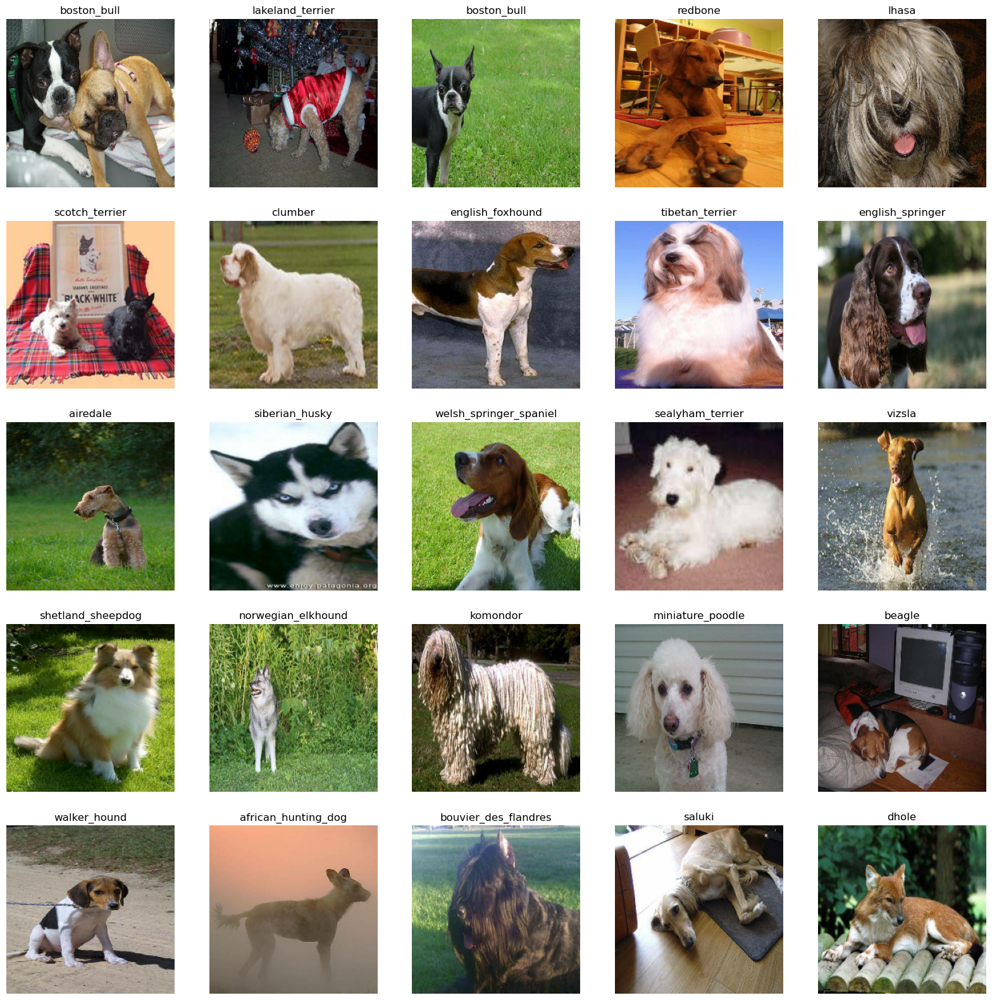

In [39]:
# Let's visualize the data in a training batch
show_25_images(train_images, train_labels)

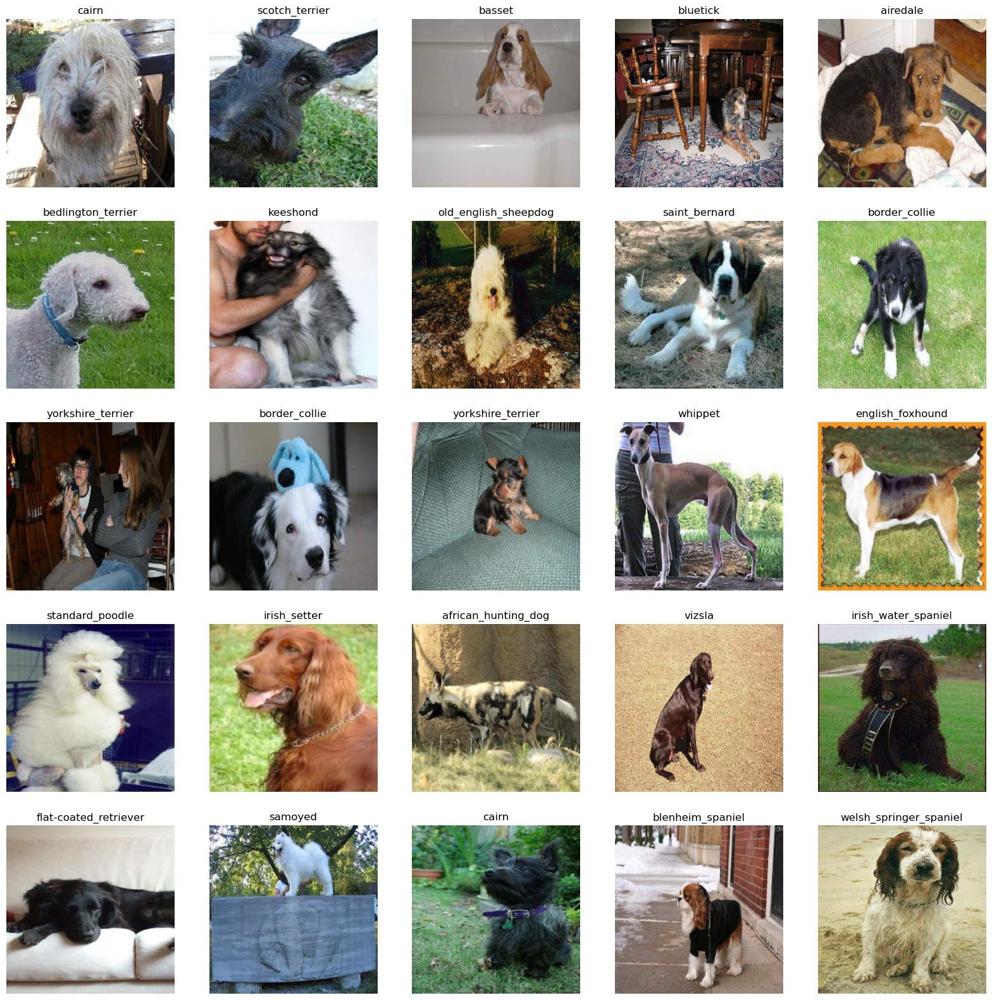

In [40]:
# # Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few things we need to define:

* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [41]:
IMG_SIZE

224

In [42]:
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] #batch, height, width, colour channels

OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

**All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview**

In [43]:
# Create a function which builds a Keras model

def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print('Building model with:',MODEL_URL)
    
    # Setup the model layers
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),  #Layer 1(input layer)
        tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                             activation="softmax")  #layer 2 (output layer)
    ])
    
    #Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=['accuracy']
    )
    
    #build the model
    model.build(INPUT_SHAPE)
    return model

In [44]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, we need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
3. Visualize our models training logs with the %tensorboard magic function.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [45]:
# Load TensorBoard notebook extension

%load_ext tensorboard

In [46]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
    #Create a log directory for storing TensorBoard logs
    logdir = os.path.join("C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\logs\\",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [47]:
# Create early stopping call back

early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                 patience=3)

## Training a model (on subset of data)

In [48]:
NUM_EPOCHS = 100

## Let's create a function which trains a model.

* Create a model using **create_model()**
* Setup a TensorBoard callback using **create_tensorboard_callback()**
* Call the **fit()** function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [49]:
# Build a function to train and return a trained model

def train_model():
    #Create a model
    model = create_model()
    
    #Create new TensorBoard session everytime we train amodel
    tensorboard = create_tensorboard_callback()
    
    #Fit the model to the data passing it the callback we created
    model.fit(x=train_data,
             epochs=NUM_EPOCHS,
             validation_data = val_data,
             validation_freq=1,
             callbacks=[tensorboard, early_stopping])
    #return the fitted model
    return model

In [50]:
#Fit the model to the data

model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 17s 395ms/step - loss: 6.3625 - accuracy: 0.0125 - val_loss: 5.7740 - val_accuracy: 0.0200
Epoch 2/100
25/25 [==============================] - 9s 371ms/step - loss: 4.5273 - accuracy: 0.0538 - val_loss: 5.3551 - val_accuracy: 0.0200
Epoch 3/100
25/25 [==============================] - 9s 369ms/step - loss: 3.7733 - accuracy: 0.1412 - val_loss: 5.5082 - val_accuracy: 0.0100
Epoch 4/100
25/25 [==============================] - 9s 370ms/step - loss: 3.2877 - accuracy: 0.2438 - val_loss: 5.4921 - val_accuracy: 0.0250
Epoch 5/100
25/25 [==============================] - 9s 362ms/step - loss: 2.9101 - accuracy: 0.3438 - val_loss: 5.6607 - val_accuracy: 0.0350
Epoch 6/100
25/25 [==============================] - 9s 349ms/step - loss: 2.5587 - accuracy: 0.4313 - val_loss: 5.7759 - val_accuracy: 0.0350
Epoch 7/100
25/25 [=============================

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [51]:
# %tensorboard --logdir='C:\Users\tamal\OneDrive\Desktop\Deep Learning\logs'

### Making and evaluating predictions using a trained model

In [52]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [53]:
# Make predictions on the validation data(not used to train the model)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 257ms/step


array([[1.7994791e-02, 2.0967344e-02, 1.1168743e-03, ..., 7.1340270e-05,
        5.1922714e-03, 4.1196570e-02],
       [2.3560736e-03, 6.9692876e-04, 6.0665836e-03, ..., 6.9994574e-05,
        2.2871210e-03, 2.5534299e-03],
       [9.6600305e-04, 1.3357993e-04, 1.9978896e-04, ..., 1.9164245e-04,
        1.5232374e-05, 1.2704336e-02],
       ...,
       [1.3592014e-03, 6.0915191e-02, 4.0534433e-04, ..., 2.8682264e-04,
        2.8514150e-03, 8.4927361e-03],
       [2.7791170e-02, 1.2241808e-03, 5.7665177e-04, ..., 9.1482437e-04,
        1.2406468e-03, 2.7741757e-03],
       [2.8481102e-04, 9.6329339e-03, 4.1474828e-05, ..., 1.6106378e-05,
        4.2570382e-04, 3.2081162e-03]], dtype=float32)

In [54]:
predictions.shape

(200, 120)

In [55]:
len(y_val)

200

In [56]:
np.sum(predictions[0])

1.0

In [57]:
# np.sum(predictions[1])

In [58]:
# First prediction
index = 20
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[6.93532464e-04 3.43755237e-03 1.13695402e-04 1.41290308e-04
 5.68130985e-03 1.00716432e-04 6.78059223e-05 1.32470215e-02
 6.65777479e-05 2.57510168e-04 3.84935327e-02 5.28733479e-04
 2.35074107e-03 2.89585977e-03 8.17884633e-04 3.04624089e-03
 1.20001566e-02 5.14413405e-04 9.54350107e-05 8.25388730e-03
 1.11915562e-02 6.45715681e-06 3.52545584e-07 1.53017943e-04
 2.64159826e-05 7.86959426e-05 8.78653303e-03 1.39911484e-03
 5.46660135e-03 2.95159989e-04 1.85753059e-04 6.03376739e-02
 2.75816559e-03 1.37434443e-02 2.22802828e-05 4.74749322e-06
 8.78776846e-05 2.03890013e-04 2.39296500e-02 6.23945962e-05
 3.88161791e-03 8.50004471e-06 1.10971499e-02 8.44705384e-03
 3.81973013e-03 3.29885748e-03 2.70099554e-04 9.80781298e-03
 3.29066679e-04 1.14733481e-03 2.63762340e-05 2.64443370e-05
 1.76922989e-03 3.95717844e-03 2.62263755e-04 5.31686412e-04
 1.05554755e-04 4.13998059e-04 1.18451286e-03 3.56389284e-02
 4.78744740e-03 9.31308232e-03 1.09059189e-03 1.32283865e-04
 5.89586678e-04 1.138719

In [59]:
unique_breeds[51]

'great_dane'

**Note:** Prediction probabilities are also known as confidence levels.

In [60]:
# Turn prediction probabilites into their respective label

def get_pred_label(prediction_probabilities):
    """
    Turn an array of prediction probabilites into a label.
    """
    return unique_breeds[np.argmax(prediction_probabilities)]

In [61]:
#Get a predicted label based on an array of prediction probabilites

pred_label = get_pred_label(predictions[51])
pred_label

'irish_setter'

In [62]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
    """
    Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
    of images and labels.
    """
    images = []
    labels = []
    # Loop through unbatched data
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        labels.append(unique_breeds[np.argmax(label)])
    return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[ 75.479095, 110.37641 ,  77.94561 ],
         [ 67.92136 ,  84.14216 ,  58.25859 ],
         [ 80.14246 ,  70.63859 ,  58.48398 ],
         ...,
         [197.91655 , 209.91655 , 206.59067 ],
         [207.29243 , 211.27643 , 214.37706 ],
         [209.33705 , 210.72528 , 214.80351 ]],
 
        [[ 59.794205,  80.589386,  49.836975],
         [ 87.078445,  93.23014 ,  69.466835],
         [114.79099 , 102.29858 ,  86.60974 ],
         ...,
         [195.43166 , 207.4205  , 207.44461 ],
         [186.25832 , 191.28064 , 195.30635 ],
         [190.02322 , 193.80655 , 199.68561 ]],
 
        [[ 76.902245,  78.605965,  53.59674 ],
         [ 74.10182 ,  69.01879 ,  46.922813],
         [105.527054,  92.2354  ,  75.582115],
         ...,
         [203.67262 , 214.67262 , 219.46428 ],
         [202.9223  , 211.29283 , 219.44418 ],
         [191.71315 , 198.65767 , 207.959   ]],
 
        ...,
 
        [[248.54286 , 251.91335 , 238.2281  ],
         [252.84027 , 254.41876 , 240.410

#### The Function will do:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅ 

In [63]:
def plot_pred(prediction_probabilities, labels, images, n=1):
    """
    View the prediction, ground truth, and image for sample
    """
    pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
    
    #Get the pred label
    pred_label = get_pred_label(pred_prob)
    
    #plot image & remove ticks
#     plt.imshow(image)
    plt.imshow(images[n].astype("uint8"))
    plt.xticks([])
    plt.yticks([])
    
    #Change the colour of the title depending on if the prediction is right or wrong
    if pred_label == true_label:
        color = "green"
    else:
        color = "red"
    
    #Change plot title to be predicted, probability of prediction and truth label
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

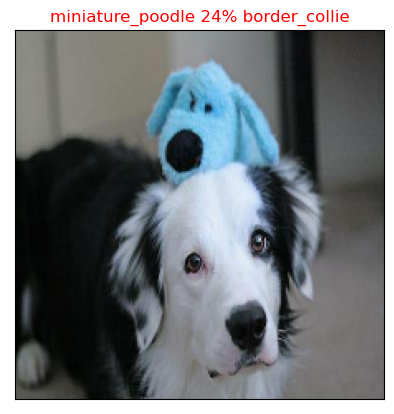

In [64]:
plot_pred(prediction_probabilities=predictions,
         labels=val_labels,
         images=val_images,
         n = 11)

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using **get_pred_label()**.
* Find the top 10:
    * Prediction probabilities indexes.
    * Prediction probabilities values. 
    * Prediction labels. 
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
    pred_prob, true_label = prediction_probabilities[n], labels[n]
    
    #Get the predicted label
    pred_label = get_pred_label(pred_prob)
    
    # Find the top 10 prediction confidence indexes
    top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
    
    # Find the top 10 prediction confidance values
    top_10_pred_values = pred_prob[top_10_pred_indexes]
    
    # Find the top 10 prediction labels
    top_10_pred_labels = unique_breeds[top_10_pred_indexes]
    
    # Setup plot
    top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
    plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
    # Change color of true label
    if np.isin(true_label, top_10_pred_labels):
        top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
    else:
        pass

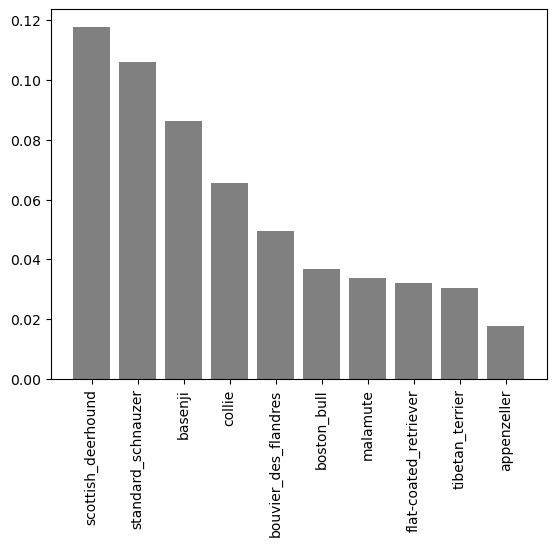

In [66]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

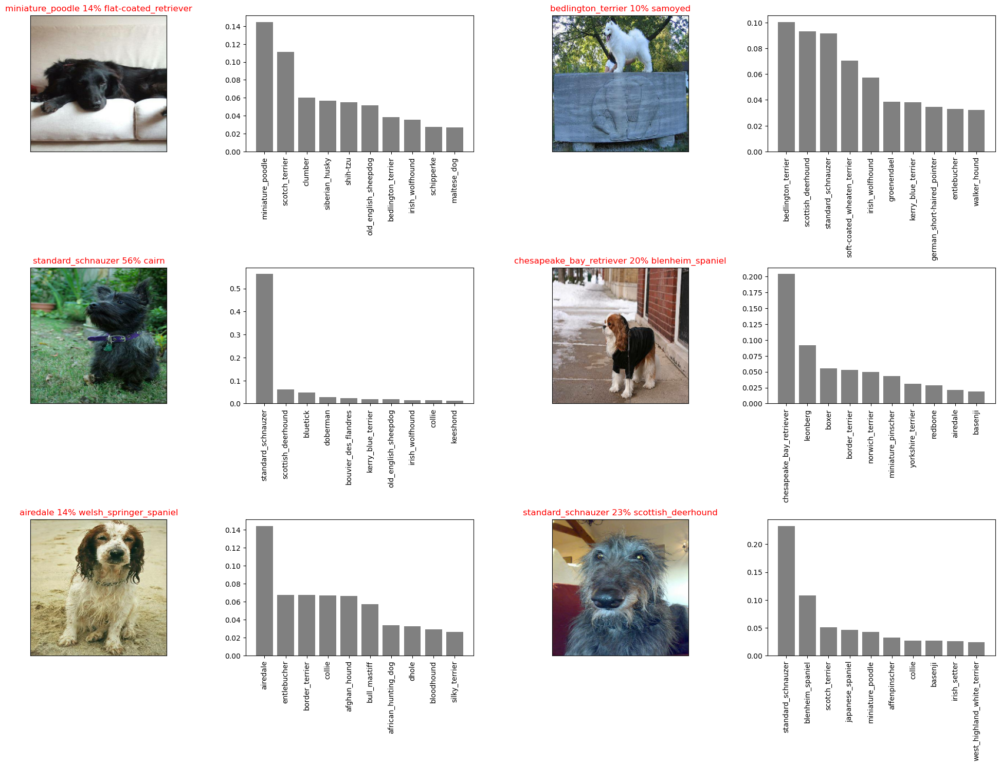

In [67]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [68]:
# Create a function to save a model
def save_model(model, suffix=None):
    # Create a model directory pathname with current time
    modeldir = os.path.join("C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\models\\",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
    model_path = modeldir + "-" + suffix + ".h5" # save format of model
    print(f"Saving model to: {model_path}...")
    model.save(model_path)
    return model_path

In [69]:
# Create a function to load a trained model
def load_model(model_path):
    """
    Loads a saved model from a specified path.
    """
    print(f"Loading saved model from: {model_path}")
    model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
    return model

In [70]:
# Save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: C:\Users\tamal\OneDrive\Desktop\Deep Learning\models\20221201-134426-1000-images-mobilenetv2-Adam.h5...


'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\models\\20221201-134426-1000-images-mobilenetv2-Adam.h5'

In [71]:
# Load a trained model
loaded_1000_image_model = load_model('C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\models\\20221130-191511-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: C:\Users\tamal\OneDrive\Desktop\Deep Learning\models\20221130-191511-1000-images-mobilenetv2-Adam.h5


In [72]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 2s 266ms/step - loss: 5.8520 - accuracy: 0.0300


[5.851987361907959, 0.029999999329447746]

In [73]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 255ms/step - loss: 5.8121 - accuracy: 0.0150


[5.812125205993652, 0.014999999664723873]

## Training a big dog model 🐶 (on the full data)

In [74]:
len(X), len(y)

(10222, 10222)

In [75]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [76]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [77]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [78]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [79]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 136s 404ms/step - loss: 5.1196 - accuracy: 0.0309
Epoch 2/100
320/320 [==============================] - 115s 359ms/step - loss: 4.4692 - accuracy: 0.0782
Epoch 3/100
320/320 [==============================] - 112s 351ms/step - loss: 4.1765 - accuracy: 0.1087
Epoch 4/100
320/320 [==============================] - 108s 338ms/step - loss: 3.9943 - accuracy: 0.1330
Epoch 5/100
320/320 [==============================] - 111s 346ms/step - loss: 3.8520 - accuracy: 0.1458
Epoch 6/100
320/320 [==============================] - 115s 359ms/step - loss: 3.7140 - accuracy: 0.1692
Epoch 7/100
320/320 [==============================] - 108s 339ms/step - loss: 3.6168 - accuracy: 0.1825
Epoch 8/100
320/320 [==============================] - 108s 339ms/step - loss: 3.5248 - accuracy: 0.2024
Epoch 9/100
320/320 [==============================] - 109s 340ms/step - loss: 3.4276 - accuracy: 0.2153
Epoch 10/100
320/320 [==============================] -

320/320 [==============================] - 109s 341ms/step - loss: 1.7115 - accuracy: 0.5511
Epoch 79/100
320/320 [==============================] - 109s 342ms/step - loss: 1.6742 - accuracy: 0.5629
Epoch 80/100
320/320 [==============================] - 108s 338ms/step - loss: 1.6810 - accuracy: 0.5607
Epoch 81/100
320/320 [==============================] - 110s 344ms/step - loss: 1.6677 - accuracy: 0.5638
Epoch 82/100
320/320 [==============================] - 109s 340ms/step - loss: 1.6514 - accuracy: 0.5653
Epoch 83/100
320/320 [==============================] - 109s 341ms/step - loss: 1.6445 - accuracy: 0.5670
Epoch 84/100
320/320 [==============================] - 109s 340ms/step - loss: 1.6260 - accuracy: 0.5706
Epoch 85/100
320/320 [==============================] - 109s 342ms/step - loss: 1.6202 - accuracy: 0.5798
Epoch 86/100
320/320 [==============================] - 109s 339ms/step - loss: 1.6183 - accuracy: 0.5775
Epoch 87/100
320/320 [==============================] - 703

In [80]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: C:\Users\tamal\OneDrive\Desktop\Deep Learning\models\20221201-180522-full-image-set-mobilenetv2-Adam.h5...


'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\models\\20221201-180522-full-image-set-mobilenetv2-Adam.h5'

In [81]:
loaded_full_model = load_model('C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\models\\20221130-223512-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: C:\Users\tamal\OneDrive\Desktop\Deep Learning\models\20221130-223512-full-image-set-mobilenetv2-Adam.h5


In [82]:
# Load test image filenames
test_path = "C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\000621fb3cbb32d8935728e48679680e.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\00102ee9d8eb90812350685311fe5890.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\001a5f3114548acdefa3d4da05474c2e.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\00225dcd3e4d2410dd53239f95c0352f.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\002c2a3117c2193b4d26400ce431eebd.jpg',
 'C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\test\\002c58d413a521ae8d1a5daeb35fc803.jpg',


In [83]:
len(test_filenames)

10357

In [84]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [85]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [86]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 101s 309ms/step


In [90]:
np.savetxt('C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\preds_array.csv',test_predictions, delimiter=',')

In [91]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learning\\dog-breed-identification\\preds_array.csv', delimiter=",")

In [92]:
test_predictions[:10]

array([[2.91887190e-08, 3.01592459e-04, 4.16850857e-03, ...,
        5.55869483e-04, 1.86669349e-03, 1.66513404e-04],
       [8.84181475e-08, 1.90384323e-11, 3.13867417e-07, ...,
        4.07254091e-03, 6.79627352e-04, 5.95654070e-04],
       [1.53231871e-04, 2.81615276e-03, 2.77539436e-03, ...,
        6.08327864e-05, 2.36519743e-02, 2.28766538e-03],
       ...,
       [1.01973594e-11, 1.13225640e-09, 3.84557051e-13, ...,
        2.17582286e-09, 4.03374652e-05, 1.63432895e-04],
       [4.77023832e-06, 1.00380305e-04, 2.31563695e-06, ...,
        2.65735139e-07, 1.19108199e-06, 5.44160685e-05],
       [1.73771827e-04, 2.08851206e-03, 1.51266204e-03, ...,
        4.83467302e-05, 1.28252525e-03, 2.71226838e-03]])

In [93]:
len(test_predictions)

10357

### Preparing test dataset predictions for Kaggle

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [94]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [95]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [96]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,2.918872e-08,3.015925e-04,4.168509e-03,1.262302e-06,3.120985e-05,1.214802e-07,0.000123,1.147103e-04,4.793437e-05,...,1.030217e-06,3.597535e-03,1.228467e-05,0.000144,0.008016,0.162519,7.269945e-07,0.000556,0.001867,0.000167
1,00102ee9d8eb90812350685311fe5890,8.841815e-08,1.903843e-11,3.138674e-07,1.005787e-04,3.808299e-07,1.855387e-07,0.000004,2.505457e-09,2.081956e-05,...,1.295978e-07,2.577367e-09,1.344382e-07,0.004161,0.084869,0.000015,5.676818e-04,0.004073,0.000680,0.000596
2,0012a730dfa437f5f3613fb75efcd4ce,1.532319e-04,2.816153e-03,2.775394e-03,5.735380e-03,3.818734e-06,1.962285e-05,0.000835,6.876948e-05,3.122224e-05,...,1.302434e-04,2.115438e-06,1.364283e-04,0.001100,0.000115,0.000571,1.908665e-04,0.000061,0.023652,0.002288
3,001510bc8570bbeee98c8d80c8a95ec1,1.469049e-03,8.867034e-02,6.438121e-07,1.047634e-02,1.578677e-07,2.135242e-03,0.000491,1.503021e-04,9.037980e-07,...,2.574250e-04,2.042573e-03,8.352347e-08,0.091937,0.000324,0.000179,9.930758e-07,0.000320,0.000626,0.011490
4,001a5f3114548acdefa3d4da05474c2e,3.301532e-07,3.336181e-05,6.695536e-03,9.868971e-07,3.536708e-05,6.195234e-07,0.001247,1.690160e-08,3.728128e-06,...,3.566475e-06,1.073011e-07,5.218480e-10,0.000005,0.000493,0.000095,1.656410e-04,0.000005,0.000798,0.002295


In [98]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("C:\\Users\\tamal\\OneDrive\\Desktop\\Deep Learningfull_model_predictions_submission_1_mobilenetV2.csv",
                index=False)